# Damped simple pendulum

In this notebook we will solve the equation of motion for a simple pendulum with damping.

## Libraries

We will use the following libraries:

* `numpy` for numerical calculations
* `matplotlib` for plotting
* `scipy.integrate` for numerical integration
* `ipywidgets` for interactive plots
* `IPython.display` for displaying the plots
* `sympy` for symbolic calculations

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint
from matplotlib import animation
from IPython.display import HTML
import sympy as sym
%matplotlib inline
import mpld3
mpld3.enable_notebook()

## Mathematical model

For this system, we will consider a simple pendulum with damping. So we have the following parameters:

* $m$ is the mass of the pendulum bob
* $l$ is the length of the pendulum
* $g$ is the acceleration of gravity
* $b$ is the damping coefficient
* $\theta$ is the angle of the pendulum
* $\omega$ is the angular velocity of the pendulum
* $t$ is the time


In [2]:
## Define symbols

# Constants
m, g, l, b= sym.symbols('m g l b', constant=True, positive=True)

# Variables
t = sym.symbols('t', real=True)
theta = sym.Function('\\theta')(t)

Now we need to define the position $x$ and $y$ of the pendulum bob. We can do this by using the following equations:

$$ x = l \sin(\theta) \qquad y = -l \cos(\theta) $$

after that, we can define the kinetic energy $T$ and the potential energy $V$ of the system:

$$T = \frac{1}{2} m \left( \dot{x}^2 + \dot{y}^2 \right) \qquad V = m g y$$

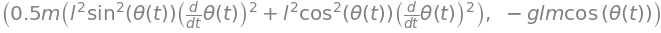

In [4]:
# Position
x = l*sym.sin(theta)
y = -l*sym.cos(theta)

# kinetic energy
T = 1/2*m*(x.diff(t)**2 + y.diff(t)**2)

# potential energy
V = m*g*y

# Print Kinetic and Potential Energy
sym.init_printing()
T, V

Now we can define the Lagrangian $L$ of the system:

$$ L = T-V$$

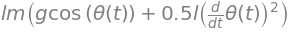

In [5]:
L = T - V
L.simplify()

As we get the Lagrangian, we can use the Euler-Lagrange equation to get the equation of motion, but we use them for a system with non-conservative forces, so we need to use the Euler-Lagrange equation for non-conservative forces:

$$\frac{d}{dt}\left(\frac{\partial L}{\partial \dot{q}_j}\right) - \frac{\partial L}{\partial q_j} - Q_j = 0$$

$$ Q_j = \sum_{i=1}^N \vec{F}_i \cdot \frac{\partial \vec{r}_i}{\partial q_j}$$

where $q_j$ is the $j$-th generalized coordinate, $\dot{q}_j$ is the time derivative of the $j$-th generalized coordinate, $\vec{r}_i$ is the position vector of the $i$-th particle, $\vec{F}_i$ is the force vector acting on the $i$-th particle, and $N$ is the number of particles.

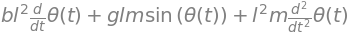

In [6]:
# Force vector, F = -b*v
F = -b*sym.Matrix([x.diff(t), y.diff(t)])

# Q_j 
Q = F.dot(sym.Matrix([x.diff(theta), y.diff(theta)])).simplify()

# Euler-Lagrange equation 
EL = (L.diff(theta.diff(t)).diff(t) - L.diff(theta) - Q).simplify().expand()
EL

For simplicty we can divide the equation by $l^2m$

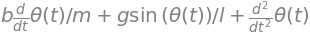

In [7]:
# Multiply| E-L equations for l^2*m
EL = EL/(l**2*m)
EL = EL.expand()
EL

Now that we have the equation of motion, we can solve it numerically.

In [8]:
sol = sym.solve(EL, sym.diff(theta, t, t), simplify=False, rational=False)
sol[0]

# Lambdicify the solution
sol_f = sym.lambdify((t, theta, sym.diff(theta, t), g, l, m, b), sol[0])

Let's define a vector $\vec{S}$ that returns $\frac{d\vec{S}}{dt}$.

In [11]:
def dSdt(S, t, g, l, m, b):
    theta, omega = S
    dtheta_dt = omega
    domega_dt = sol_f(t, theta, omega, g, l, m, b)
    return dtheta_dt, domega_dt

Now we can solve the equation of motion numerically.

In [12]:
t = np.linspace(0, 40, 1001)
theta0 = np.pi * 0.99
theta_dot0 = 0
g = 9.81
l = 1
m = 2
b = 0.3

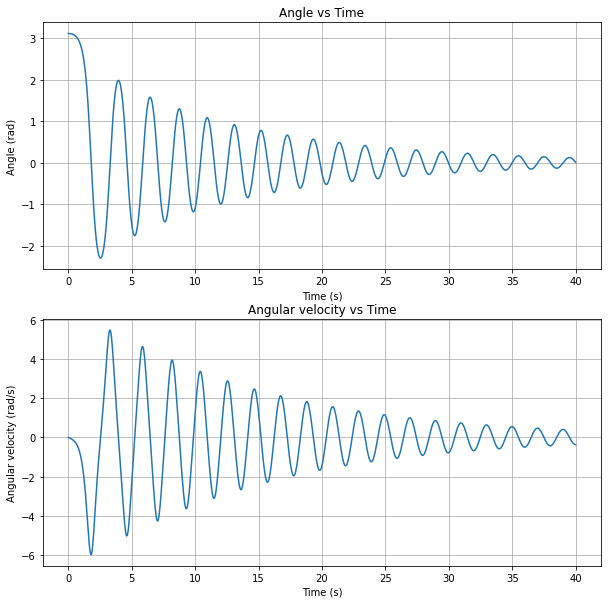

In [13]:
ans = odeint(dSdt, (theta0, theta_dot0), t, args=(g, l, m, b))

# Plot of the position and velocity of the pendulum
fig, ax = plt.subplots(2, 1, figsize=(10, 10))
ax[0].plot(t, ans[:, 0])
ax[0].set_xlabel('Time (s)')
ax[0].set_ylabel('Angle (rad)')
ax[0].set_title('Angle vs Time')
ax[0].grid()
ax[1].plot(t, ans[:, 1])
ax[1].set_xlabel('Time (s)')
ax[1].set_ylabel('Angular velocity (rad/s)')
ax[1].set_title('Angular velocity vs Time')
ax[1].grid()
plt.show()

We can plot the phase space of the system.

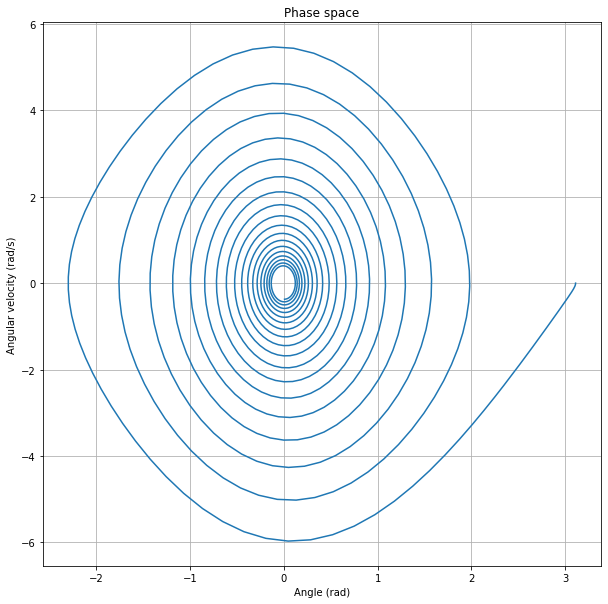

In [14]:
fig, ax = plt.subplots(figsize=(10, 10))
ax.plot(ans[:, 0], ans[:, 1])
ax.set_xlabel('Angle (rad)')
ax.set_ylabel('Angular velocity (rad/s)')
ax.set_title('Phase space')
ax.grid()
plt.show()

If we want to see a plot of the phase space for diferent initial conditions, we can use `streamplot`.

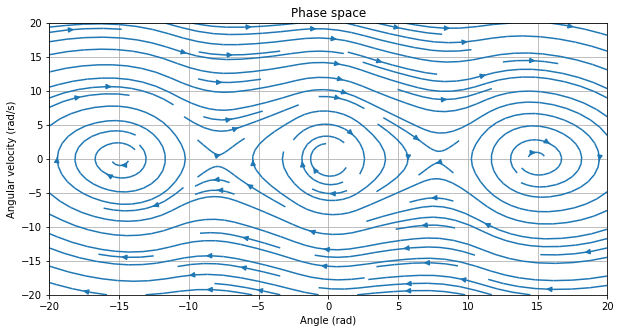

In [15]:
fig, ax = plt.subplots(figsize=(10, 5))
theta_values, omega_values = np.meshgrid(np.linspace(-20, 20, 10), np.linspace(-20, 20, 10))
u_values = omega_values
v_values = -g/l*np.sin(theta_values) - b/m*omega_values
ax.streamplot(theta_values, omega_values, u_values, v_values, density=1)
ax.set_xlabel('Angle (rad)')
ax.set_ylabel('Angular velocity (rad/s)')
ax.set_title('Phase space')
ax.grid()
plt.show()

Finally, we can plot the position of the pendulum bob.

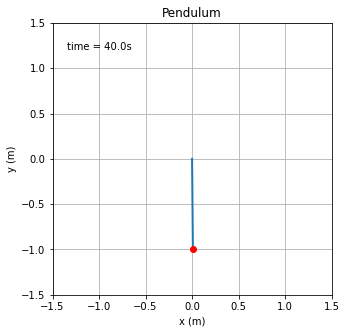

In [16]:
def theta_x_y(theta, l):
    x = l*np.sin(theta)
    y = -l*np.cos(theta)
    return x, y

# Make the animation
fig, ax = plt.subplots(figsize=(5, 5))
ax.set_xlim(-1.5, 1.5)
ax.set_ylim(-1.5, 1.5)
ax.set_xlabel('x (m)')
ax.set_ylabel('y (m)')
ax.set_title('Pendulum')
ax.grid()
line, = ax.plot([], [], lw=2)
point_mass = ax.plot([], [], 'o', color='red')[0]
time_template = 'time = %.1fs'
time_text = ax.text(0.05, 0.9, '', transform=ax.transAxes)

def init():
    line.set_data([], [])
    point_mass.set_data([], [])
    time_text.set_text('')
    return line, point_mass, time_text

def animate(i):
    x, y = theta_x_y(ans[i, 0], l)
    line.set_data([0, x], [0, y])
    point_mass.set_data(x, y)
    time_text.set_text(time_template % (i*0.04))
    return line, point_mass, time_text


ani = animation.FuncAnimation(fig, animate, np.arange(1, len(ans)),
                                interval=25, blit=True, init_func=init)
ani.embed_limit = len(ans)*200
HTML(ani.to_jshtml())